In [2]:
%load_ext autoreload
%autoreload 2

In [22]:
#! pip install ndjson

In [23]:
from google.cloud import storage
import json
import ndjson
import random
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt

# DRAW A SAMPLE OF DRAWINGS FROM A CLASS

### UTILITY FUNCTIONS

In [26]:
# Download a blob from a bucket and store it in memory
def download_blob_to_memory(bucket_name, source_blob_name) -> list:
    '''
    Downloads a (ndjson) blob from the bucket and return json file as dict
    '''
    # Initialize a client
    storage_client = storage.Client()

    # Get the bucket
    bucket = storage_client.bucket(bucket_name)

    # Get the blob
    blob = bucket.blob(source_blob_name)

    # Download the blob content as a string
    blob_content = blob.download_as_string()

    # Need to replace all single quotes with double quotes for processed
    # Not need once processing code has been updated
    blob_content = str(blob_content, encoding='utf-8').replace("'",'"')

    # Load JSON from the blob contents
    json_data = ndjson.loads(blob_content)

    # Returns a list of dictionaries - each dictionary represents one drawing
    return json_data

In [53]:
def load_json_from_local (folder_path: str, file_name: str) -> list: 
    file_path = folder_path+file_name
    with open(file_path, 'r') as file : 
        json_data = json.load(file)
    print(f'Loaded {file_name} from {folder_path}')
    return json_data

In [54]:
def save_json_to_local (data: list, folder_path: str, file_name: str) -> None: 
    file_path = folder_path+file_name
    with open(file_path, 'w') as file : 
        json.dump(data, file)
    print(f'Saved data to {file_path}')
    return None

### DOWNLOAD CLASS SAMPLE

In [27]:
folder_path = 'quickdraw-simplified'
blob = 'The Mona Lisa.ndjson'

json_data = download_blob_to_memory(folder_path, blob)

In [28]:
json_data[0]

{'word': 'The Mona Lisa',
 'countrycode': 'US',
 'timestamp': '2017-03-03 17:39:51.33205 UTC',
 'recognized': True,
 'key_id': '4748921119178752',
 'drawing': [[[101,
    98,
    91,
    83,
    80,
    80,
    82,
    92,
    104,
    117,
    139,
    154,
    169,
    180,
    181,
    177],
   [35, 33, 34, 44, 58, 97, 109, 130, 142, 149, 146, 135, 114, 90, 77, 50]],
  [[91, 86, 94, 91, 83, 77, 68], [104, 116, 154, 179, 196, 226, 234]],
  [[4,
    0,
    0,
    12,
    5,
    13,
    26,
    40,
    115,
    151,
    165,
    199,
    233,
    238,
    236,
    245,
    241,
    228],
   [222,
    216,
    208,
    162,
    110,
    75,
    40,
    24,
    0,
    8,
    18,
    62,
    93,
    110,
    146,
    174,
    195,
    233]],
  [[168, 173, 200, 211, 203], [120, 157, 183, 203, 255]],
  [[3, 59, 89], [212, 232, 235]],
  [[208, 222, 245], [235, 235, 228]],
  [[97, 135, 154, 169], [36, 35, 42, 56]],
  [[112, 113, 120, 144], [104, 107, 109, 110]],
  [[114, 112], [68, 76]],
  [[

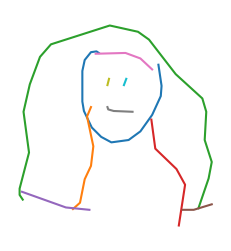

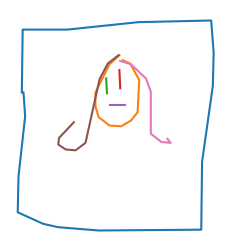

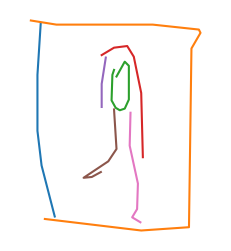

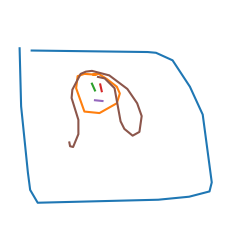

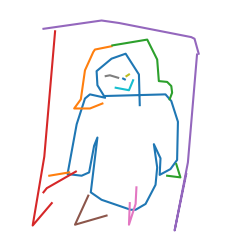

...

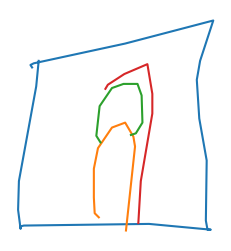

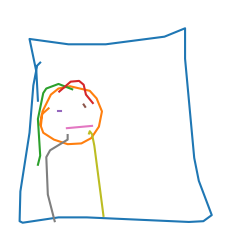

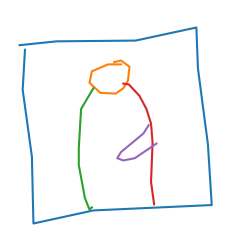

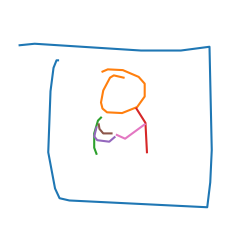

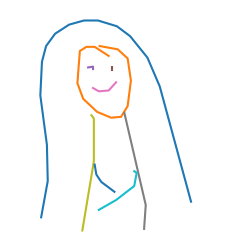

In [ ]:
for i in range(50) :
    drawing = json_data[i]
    
    plt.figure(figsize=(6,3))
    
    for stroke in drawing['drawing'] :
        x = stroke[0]
        y = stroke[1]

        plt.subplot(1,2,2)
        plt.plot(x, y, marker='')
        plt.axis('off')

    plt.gca().invert_yaxis()
    plt.axis('equal')
    plt.show()  
    

In [99]:
def plot_drawing_grid(json_data, rows, cols, title, colorful=False):
    color = None if colorful else 'k'
    
    total_plots = rows * cols
    random_list = random.sample(range(100),total_plots)
    
    fig, axes = plt.subplots(rows, cols, figsize=(12, 6))
    fig.suptitle(title, fontsize=16)
    
    for i in range(total_plots):
        # First x images in the sample
        # drawing = json_data[i]
        
        # Random drawings from 100 sample
        drawing = json_data[random_list[i]]

        ax = axes[i // cols, i % cols]
        
        for stroke in drawing['drawing']:
            x = stroke[0]
            y = stroke[1]
            ax.plot(x, y, marker='', color=color)
            ax.axis('off')
        
        ax.invert_yaxis()
        ax.axis('equal')
    
    plt.tight_layout()
    plt.show()

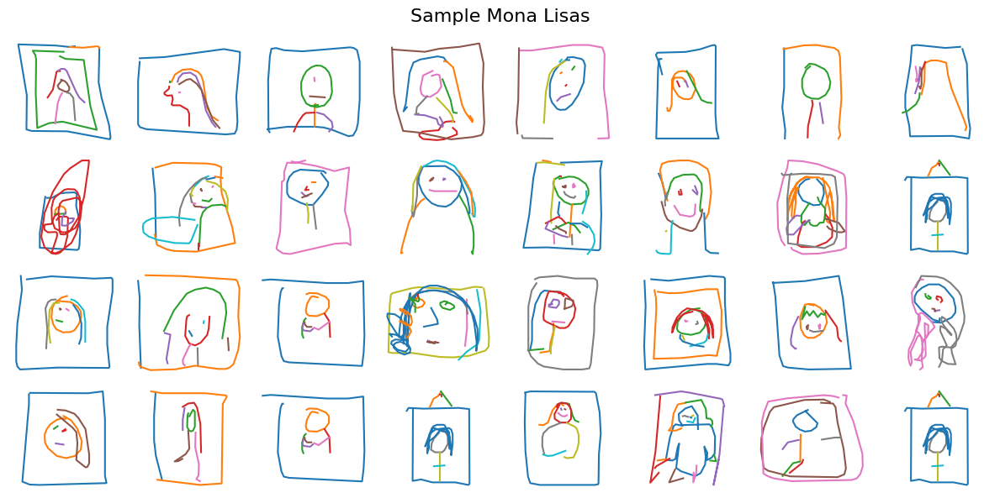

In [92]:
# Example usage
plot_drawing_grid(json_data, 4, 8, title="Sample Mona Lisas", colorful=True)  # Create a grid of x rows and y columns with a title

In [39]:
with open('../data/mappings/dict_50_class_subset.json','r') as f :
    dict_50_class_subset = json.load(f)

In [46]:
file_list = [name+'.ndjson' for name in list(dict_50_class_subset.keys())]
print(file_list)

['aircraft carrier.ndjson', 'arm.ndjson', 'asparagus.ndjson', 'backpack.ndjson', 'banana.ndjson', 'basketball.ndjson', 'bottlecap.ndjson', 'bread.ndjson', 'broom.ndjson', 'bulldozer.ndjson', 'butterfly.ndjson', 'camel.ndjson', 'canoe.ndjson', 'chair.ndjson', 'compass.ndjson', 'cookie.ndjson', 'drums.ndjson', 'eyeglasses.ndjson', 'face.ndjson', 'fan.ndjson', 'fence.ndjson', 'fish.ndjson', 'flying saucer.ndjson', 'grapes.ndjson', 'hand.ndjson', 'hat.ndjson', 'horse.ndjson', 'light bulb.ndjson', 'lighthouse.ndjson', 'line.ndjson', 'marker.ndjson', 'mountain.ndjson', 'mouse.ndjson', 'parachute.ndjson', 'passport.ndjson', 'pliers.ndjson', 'potato.ndjson', 'sea turtle.ndjson', 'snowflake.ndjson', 'spider.ndjson', 'square.ndjson', 'steak.ndjson', 'swing set.ndjson', 'sword.ndjson', 'telephone.ndjson', 'television.ndjson', 'tooth.ndjson', 'traffic light.ndjson', 'trumpet.ndjson', 'violin.ndjson']


In [49]:
sample_drawings = []

for file in file_list :
    sample_drawings += download_blob_to_memory(folder_path, file)[0:100]
    print(f'Downloaded {file} samples')

Downloaded aircraft carrier.ndjson samples
Downloaded arm.ndjson samples
Downloaded asparagus.ndjson samples
Downloaded backpack.ndjson samples
Downloaded banana.ndjson samples
Downloaded basketball.ndjson samples
Downloaded bottlecap.ndjson samples
Downloaded bread.ndjson samples
Downloaded broom.ndjson samples
Downloaded bulldozer.ndjson samples
Downloaded butterfly.ndjson samples
Downloaded camel.ndjson samples
Downloaded canoe.ndjson samples
Downloaded chair.ndjson samples
Downloaded compass.ndjson samples
Downloaded cookie.ndjson samples
Downloaded drums.ndjson samples
Downloaded eyeglasses.ndjson samples
Downloaded face.ndjson samples
Downloaded fan.ndjson samples
Downloaded fence.ndjson samples
Downloaded fish.ndjson samples
Downloaded flying saucer.ndjson samples
Downloaded grapes.ndjson samples
Downloaded hand.ndjson samples
Downloaded hat.ndjson samples
Downloaded horse.ndjson samples
Downloaded light bulb.ndjson samples
Downloaded lighthouse.ndjson samples
Downloaded line.nd

In [56]:
save_json_to_local(sample_drawings,'../data/drawings/', 'sample_drawings.json')

Saved data to ../data/drawings/sample_drawings.json


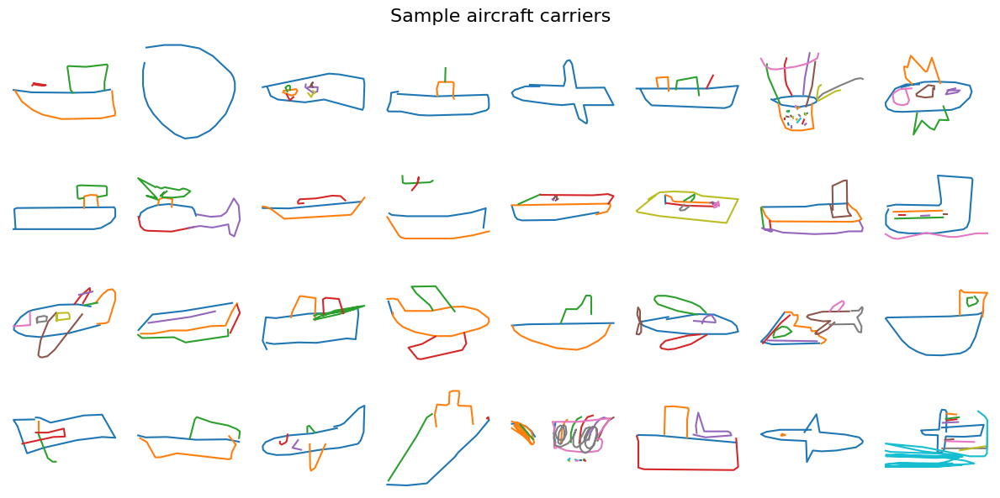

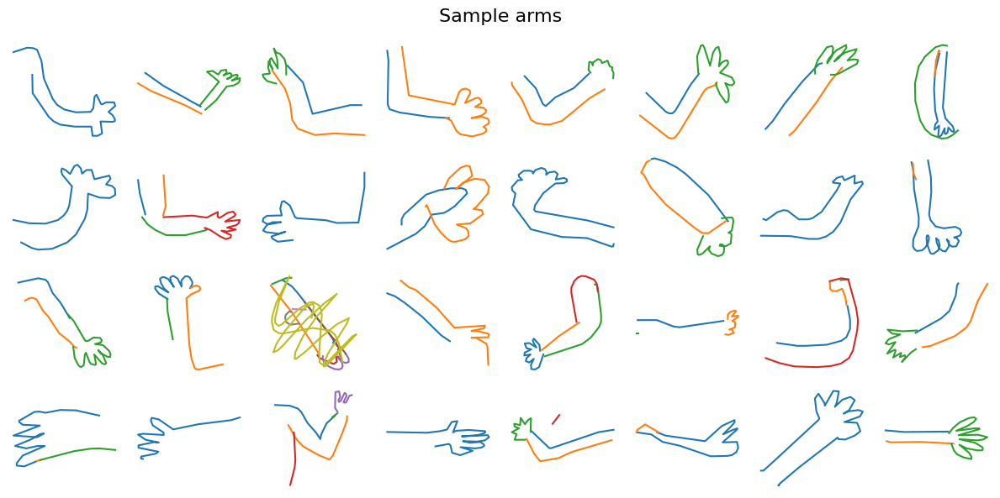

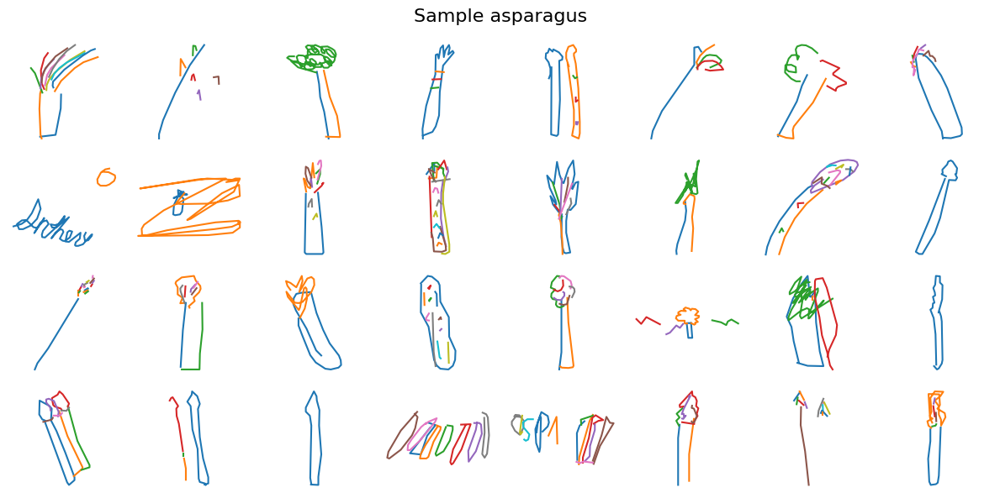

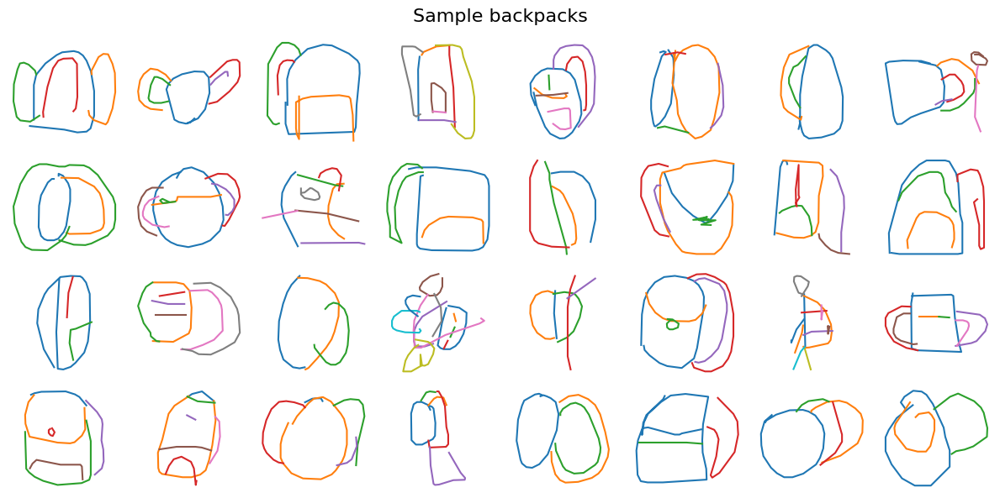

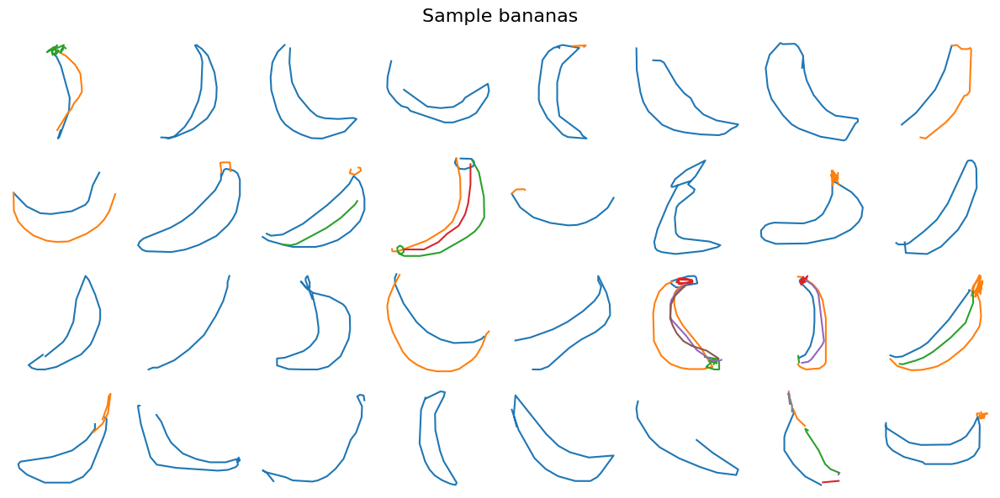

...

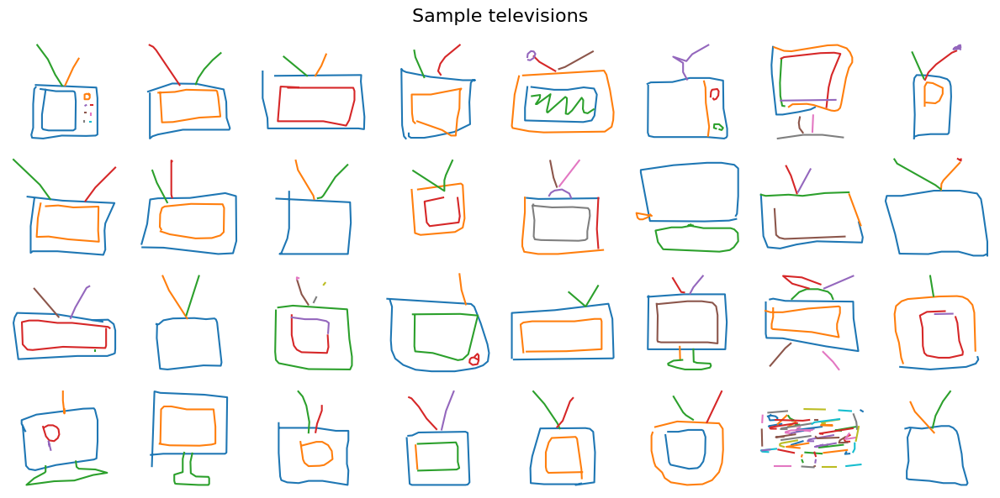

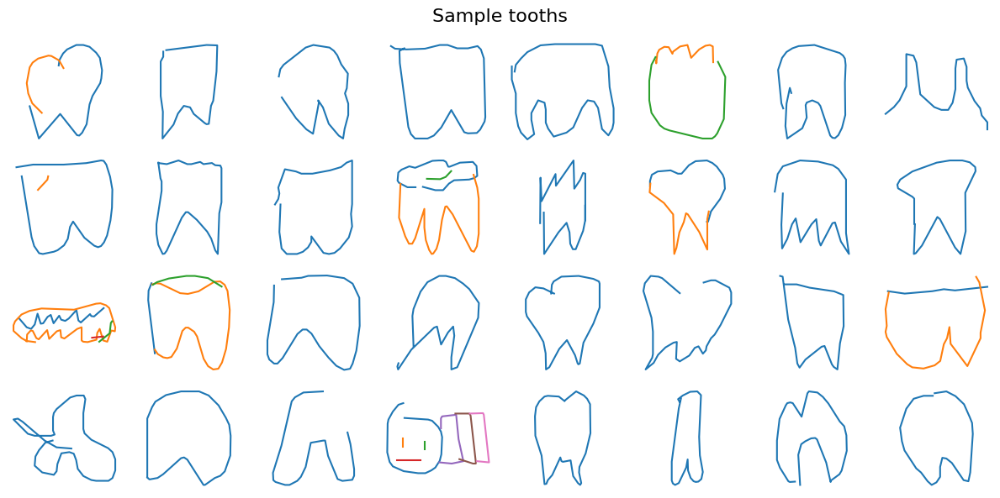

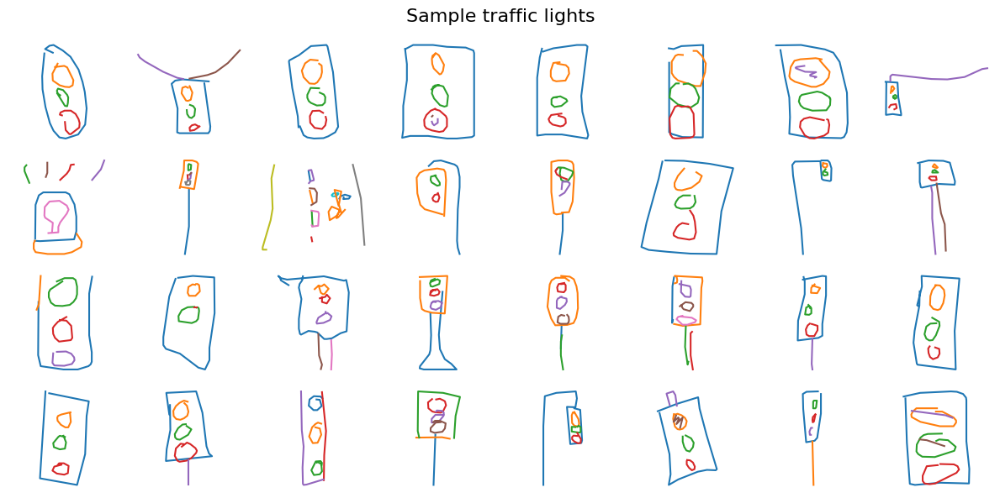

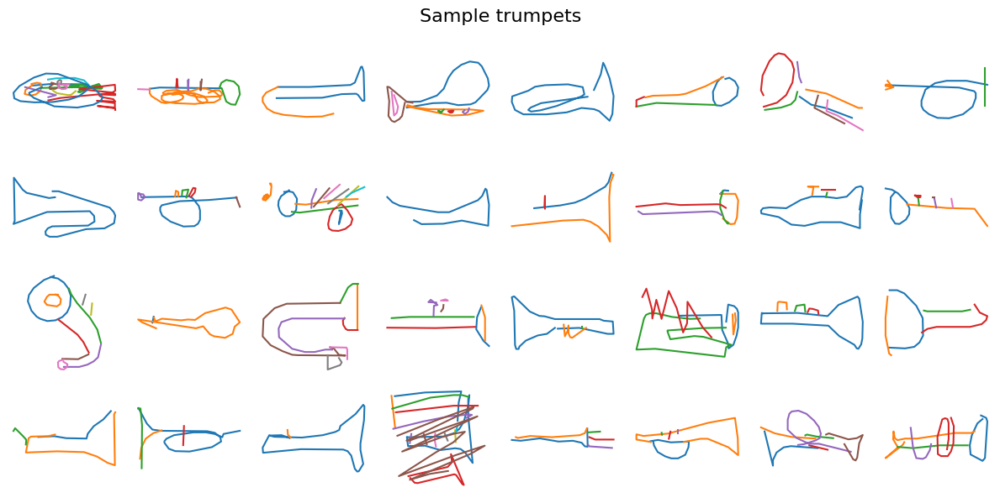

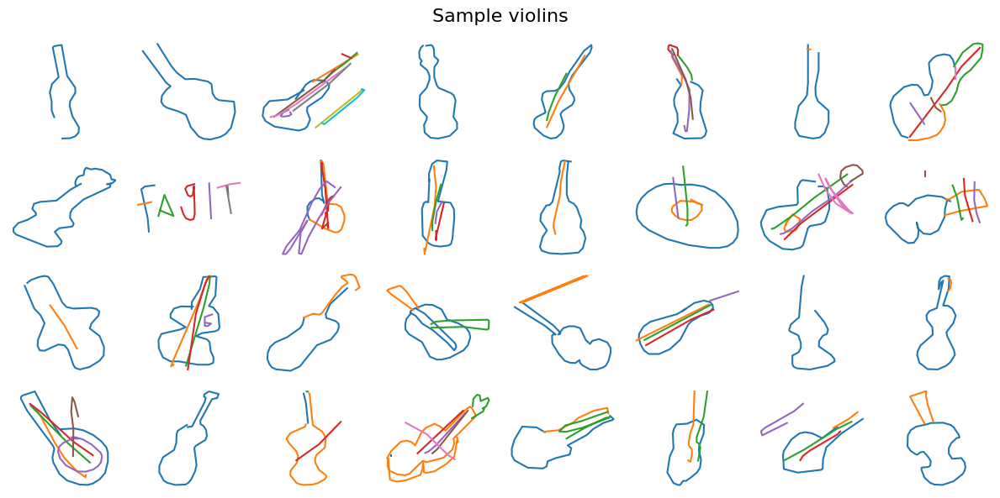

In [100]:
for i in range(len(dict_50_class_subset)) : 
    word = list(dict_50_class_subset.keys())[i]
    subset_drawings = [drawing for drawing in sample_drawings if drawing['word'] == word]
    # Create a grid of x rows and y columns with a title
    plot_drawing_grid(subset_drawings, 4, 8, title=f"Sample {word}{'' if word[-1]=='s' else 's'}", colorful=True)  

### CONVERTING DRAWING STROKES INTO BMP

In [103]:
#! pip install opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 23.6 MB/s eta 0:00:00:00:0100:01


In [104]:
import cv2
BASE_SIZE = 256

In [138]:
# Create a bmp np.array fromt the strokes in a drawing file
def draw_image_from_strokes(raw_strokes, size=256, lw=6, augmentation = False):
    img = np.zeros((BASE_SIZE, BASE_SIZE), np.uint8)
    for t, stroke in enumerate(raw_strokes):
        for i in range(len(stroke[0]) - 1):
            color = 255
            _ = cv2.line(img, (stroke[0][i], stroke[1][i]),
                         (stroke[0][i + 1], stroke[1][i + 1]), color, lw)
    if size != BASE_SIZE:
        img = cv2.resize(img, (size, size))
    if augmentation:
        if random.random() > 0.5:
            img = np.fliplr(img)
    return img

In [144]:
bmp = draw_image_from_strokes(sample_drawings[0]['drawing'], size=28)

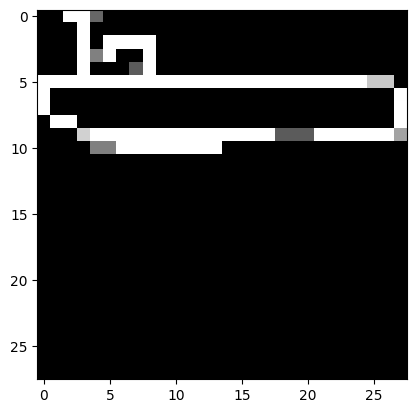

In [146]:
plt.imshow(bmp, cmap='gray')

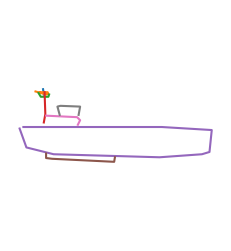

In [149]:
# Compared to PLOTTING this image from points

drawing = sample_drawings[0]
    
plt.figure(figsize=(6,3))

for stroke in drawing['drawing'] :
    x = stroke[0]
    y = stroke[1]

    plt.subplot(1,2,2)
    plt.plot(x, y, marker='')
    plt.axis('off')

plt.gca().invert_yaxis()
plt.axis('equal')
plt.show()

In [151]:
# Compare this to plotting the bitmap numpy file

def draw_bitmap(array):
    # Reshape the array to 28x28
    bitmap = array.reshape(28, 28)
    
    # Plot the bitmap
    plt.imshow(bitmap, cmap='gray')
    plt.axis('off')  # Turn off axis
    plt.show()
    


In [152]:
np_bmp = np.load('./data/numpy_bitmap/aircraft carrier.npy')[0]

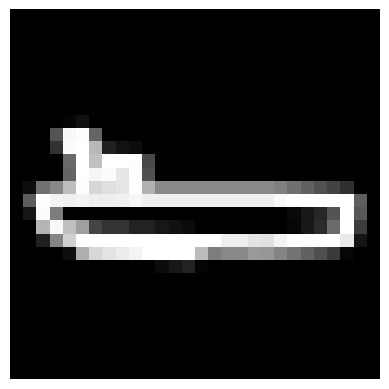

In [153]:
draw_bitmap(np_bmp)

The three versions - from strokes, plotting and Google provided bmp files all look similar. The Google bitmaps are fuzzier and more centred... but as a starting point, will use Google bmps. The above code will allow a stroke file from front end be converted to check against a CNN model based on these images. 